In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from ipywidgets import interact
%matplotlib inline

In [2]:
df = pd.read_csv(r"C:\Users\USER\OneDrive\Desktop\database\CarPrice_Assignment 1.csv")

In [3]:
df.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [4]:
### Check missing Values

df.isnull().sum()

car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

In [5]:
df.drop('car_ID',axis = 1,inplace=True)

In [6]:
## EDA

In [7]:
df['CarName'].unique()

array(['alfa-romero giulia', 'alfa-romero stelvio',
       'alfa-romero Quadrifoglio', 'audi 100 ls', 'audi 100ls',
       'audi fox', 'audi 5000', 'audi 4000', 'audi 5000s (diesel)',
       'bmw 320i', 'bmw x1', 'bmw x3', 'bmw z4', 'bmw x4', 'bmw x5',
       'chevrolet impala', 'chevrolet monte carlo', 'chevrolet vega 2300',
       'dodge rampage', 'dodge challenger se', 'dodge d200',
       'dodge monaco (sw)', 'dodge colt hardtop', 'dodge colt (sw)',
       'dodge coronet custom', 'dodge dart custom',
       'dodge coronet custom (sw)', 'honda civic', 'honda civic cvcc',
       'honda accord cvcc', 'honda accord lx', 'honda civic 1500 gl',
       'honda accord', 'honda civic 1300', 'honda prelude',
       'honda civic (auto)', 'isuzu MU-X', 'isuzu D-Max ',
       'isuzu D-Max V-Cross', 'jaguar xj', 'jaguar xf', 'jaguar xk',
       'maxda rx3', 'maxda glc deluxe', 'mazda rx2 coupe', 'mazda rx-4',
       'mazda glc deluxe', 'mazda 626', 'mazda glc', 'mazda rx-7 gs',
       'mazda glc 

In [8]:
df['CarName'] = df['CarName'].apply(lambda x: x.split(' ')[0])

In [9]:
pd.Series(df['CarName'].unique()).to_clipboard()

In [10]:
name_correction = pd.read_csv(r'C:\Users\USER\OneDrive\Desktop\database\CarName_Correction.csv')
name_correction.dropna(inplace=True)
name_correction.reset_index(inplace=True,drop=True)

In [12]:
for i in name_correction.index:
    car_name = name_correction.loc[i,'brandname']
    correction = name_correction.loc[i,'corrected']
    df['CarName'] = df['CarName'].replace(car_name,correction)

In [13]:
df['CarName'].unique()

array(['alfa-romero', 'audi', 'bmw', 'chevrolet', 'dodge', 'honda',
       'isuzu', 'jaguar', 'mazda', 'buick', 'mercury', 'mitsubishi',
       'nissan', 'peugeot', 'plymouth', 'porsche', 'renault', 'saab',
       'subaru', 'toyota', 'volkswagen', 'volvo'], dtype=object)

In [14]:
profile = ProfileReport(df, title="Pandas Profiling Report",explorative=True)


In [15]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
corr = df.corr()

<AxesSubplot:>

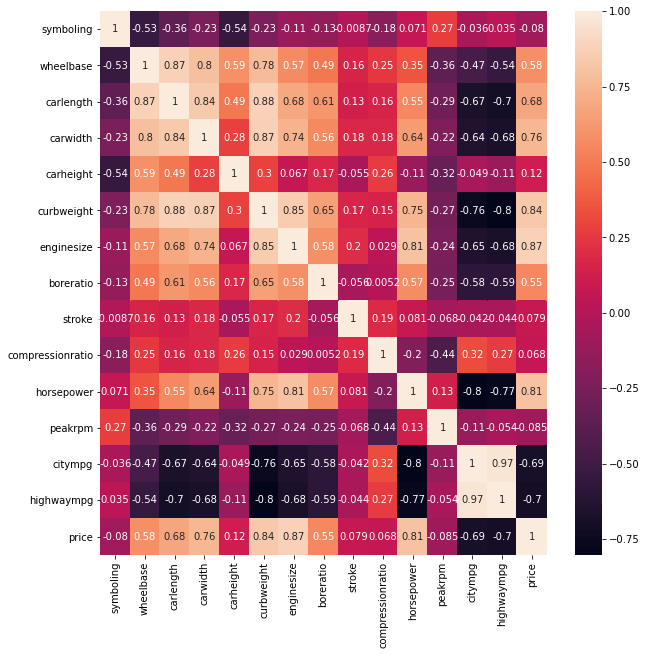

In [17]:
plt.figure(figsize=(10,10))
sns.heatmap(corr,annot=True)

In [18]:
obs = df.select_dtypes('O').columns
num = [col for col in df.columns if col not in obs]

In [19]:
def uni_cat_ana(var1,var2='price'):
    plt.figure(figsize=(8,4))
    sns.boxplot(x=var1,y=var2,data=df)
    plt.xticks(rotation= 90)
    plt.show()

interact(uni_cat_ana,var1=obs,var2 = num)

interactive(children=(Dropdown(description='var1', options=('CarName', 'fueltype', 'aspiration', 'doornumber',…

<function __main__.uni_cat_ana(var1, var2='price')>

<AxesSubplot:xlabel='price', ylabel='Density'>

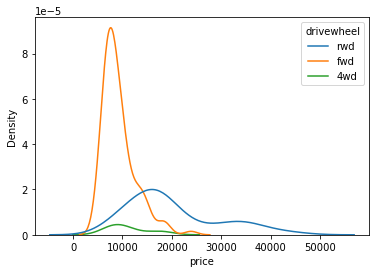

In [20]:
sns.kdeplot(x='price',data=df,hue='drivewheel')

In [21]:
df['drivewheel'].value_counts()

fwd    120
rwd     76
4wd      9
Name: drivewheel, dtype: int64

In [25]:
def cont_var_anaylyis(var1,hue,var2='price'):
    plt.figure(figsize=(8,5))
    sns.scatterplot(x=var1,y=var2,data=df,hue=hue)
    plt.show()
    
interact(cont_var_anaylyis,var1=num,var2=num,hue=obs)

interactive(children=(Dropdown(description='var1', options=('symboling', 'wheelbase', 'carlength', 'carwidth',…

<function __main__.cont_var_anaylyis(var1, hue, var2='price')>

C:\Users\USER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='price'>

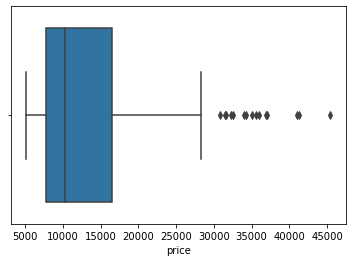

In [22]:
sns.boxplot('price',data=df)

In [23]:
df = df[df['price'] < np.percentile(df.price,99)]

C:\Users\USER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='price'>

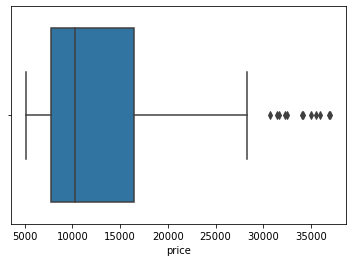

In [24]:
sns.boxplot('price',data=df)

In [26]:
### Feature Engineering

In [27]:
df['mean_mpg'] = (df['citympg']+df['highwaympg'])/2

<ipython-input-27-6dd445a4d423>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['mean_mpg'] = (df['citympg']+df['highwaympg'])/2


In [28]:
df_dummies = pd.get_dummies(df,drop_first=True)

### Model Building

In [29]:
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.preprocessing import StandardScaler,MinMaxScaler

In [30]:
X= df_dummies.drop('price',axis=1)
y= df_dummies.price

In [31]:
## Train test split
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=420)


In [32]:
## Checking Scaling and Non Scaling Performance


In [33]:
## Non Scale

model = LinearRegression(fit_intercept=True)
model.fit(x_train,y_train) ## Traing the Model
 
y_train_pred = model.predict(x_train) ## Getting Predicted Values from train
y_test_pred = model.predict(x_test) ## Predicted Values from test


print('Train Performance')
rmse = np.sqrt(mean_squared_error(y_train,y_train_pred))
r2 = r2_score(y_train,y_train_pred)
print(f'RMSE :{rmse}, R2: {r2}')

print('Test Performance')
rmse = np.sqrt(mean_squared_error(y_test,y_test_pred))
r2 = r2_score(y_test,y_test_pred)
print(f'RMSE :{rmse}, R2: {r2}')

Train Performance
RMSE :1159.5328709080402, R2: 0.9728568292663882
Test Performance
RMSE :1827.1885247583646, R2: 0.943470884376404


In [34]:
## Scaling of Data
scaler = StandardScaler()
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)




model = LinearRegression(fit_intercept=True)
model.fit(x_train_scaled,y_train) ## Traing the Model
 
y_train_pred = model.predict(x_train_scaled) ## Getting Predicted Values from train
y_test_pred = model.predict(x_test_scaled) ## Predicted Values from test


print('Train Performance')
rmse = np.sqrt(mean_squared_error(y_train,y_train_pred))
r2 = r2_score(y_train,y_train_pred)
print(f'RMSE :{rmse}, R2: {r2}')

print('Test Performance')
rmse = np.sqrt(mean_squared_error(y_test,y_test_pred))
r2 = r2_score(y_test,y_test_pred)
print(f'RMSE :{rmse}, R2: {r2}')

Train Performance
RMSE :1160.1502125130696, R2: 0.9728279192291455
Test Performance
RMSE :121249607993952.92, R2: -2.48923649343434e+20


In [35]:
## Feature Selection in Linear Regression
x_train.shape

(161, 65)

C:\Users\USER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


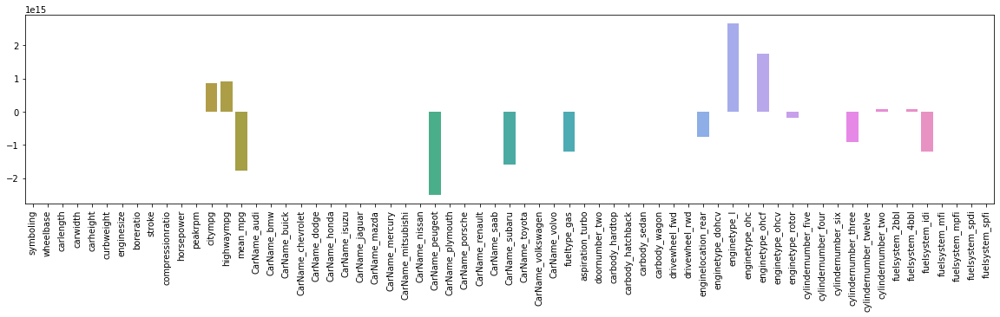

In [36]:
plt.figure(figsize=(20,4))
sns.barplot(x_train.columns,model.coef_)
plt.xticks(rotation=90)
plt.show()

Train Performance
RMSE :1285.406233857632, R2: 0.9666439011164873
Test Performance
RMSE :1667.9666144789858, R2: 0.9528935712785396


C:\Users\USER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


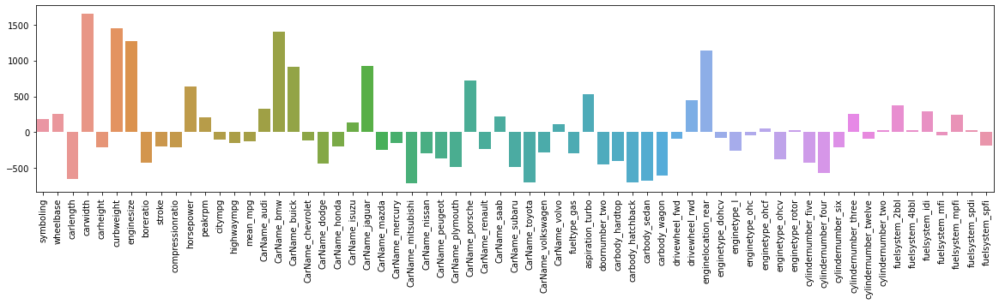

In [37]:
## Scaling of Data
scaler = StandardScaler()
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)




model = Ridge(alpha=5)
model.fit(x_train_scaled,y_train) ## Traing the Model
 
y_train_pred = model.predict(x_train_scaled) ## Getting Predicted Values from train
y_test_pred = model.predict(x_test_scaled) ## Predicted Values from test


print('Train Performance')
rmse = np.sqrt(mean_squared_error(y_train,y_train_pred))
r2 = r2_score(y_train,y_train_pred)
print(f'RMSE :{rmse}, R2: {r2}')

print('Test Performance')
rmse = np.sqrt(mean_squared_error(y_test,y_test_pred))
r2 = r2_score(y_test,y_test_pred)
print(f'RMSE :{rmse}, R2: {r2}')

plt.figure(figsize=(20,4))
sns.barplot(x_train.columns,model.coef_)
plt.xticks(rotation=90)
plt.show()

In [38]:
## Tuning the Alpha Value
alpha_range = np.linspace(0.01,5,200)
train_rmse =[]
test_rmse = []
train_r2 =[]
test_r2 = []
for a in alpha_range:
    model = Ridge(alpha=a)
    model.fit(x_train_scaled,y_train) ## Traing the Model

    y_train_pred = model.predict(x_train_scaled) ## Getting Predicted Values from train
    y_test_pred = model.predict(x_test_scaled) ## Predicted Values from test


    rmse = np.sqrt(mean_squared_error(y_train,y_train_pred))
    r2 = r2_score(y_train,y_train_pred)
    train_rmse.append(rmse)
    train_r2.append(r2)

    rmse = np.sqrt(mean_squared_error(y_test,y_test_pred))
    r2 = r2_score(y_test,y_test_pred)
    test_rmse.append(rmse)
    test_r2.append(r2)


<AxesSubplot:>

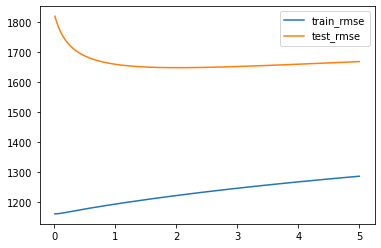

In [39]:
sns.lineplot(x=alpha_range,y=train_rmse,label='train_rmse')
sns.lineplot(x=alpha_range,y=test_rmse,label='test_rmse')

Train Performance
RMSE :1198.5167569944008, R2: 0.971001023501524
Test Performance
RMSE :1654.1401381190399, R2: 0.9536713043599597


C:\Users\USER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


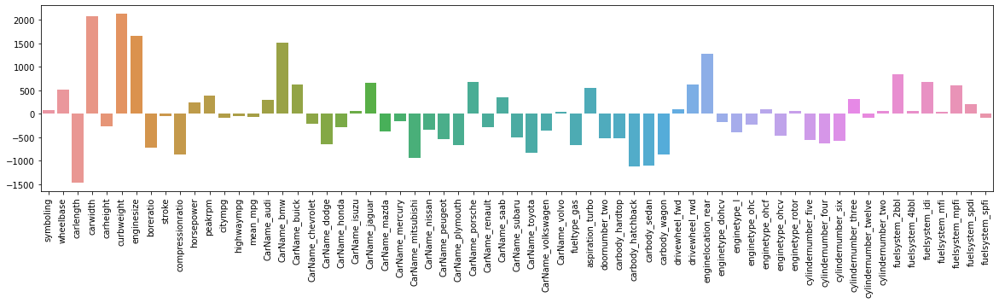

In [40]:
## Scaling of Data
scaler = StandardScaler()
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)




model = Ridge(alpha=1.2)
model.fit(x_train_scaled,y_train) ## Traing the Model
 
y_train_pred = model.predict(x_train_scaled) ## Getting Predicted Values from train
y_test_pred = model.predict(x_test_scaled) ## Predicted Values from test


print('Train Performance')
rmse = np.sqrt(mean_squared_error(y_train,y_train_pred))
r2 = r2_score(y_train,y_train_pred)
print(f'RMSE :{rmse}, R2: {r2}')

print('Test Performance')
rmse = np.sqrt(mean_squared_error(y_test,y_test_pred))
r2 = r2_score(y_test,y_test_pred)
print(f'RMSE :{rmse}, R2: {r2}')

plt.figure(figsize=(20,4))
sns.barplot(x_train.columns,model.coef_)
plt.xticks(rotation=90)
plt.show()

Train Performance
RMSE :1226.691100277881, R2: 0.9696216012811846
Test Performance
RMSE :1685.6284535383945, R2: 0.9518906842404895


C:\Users\USER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


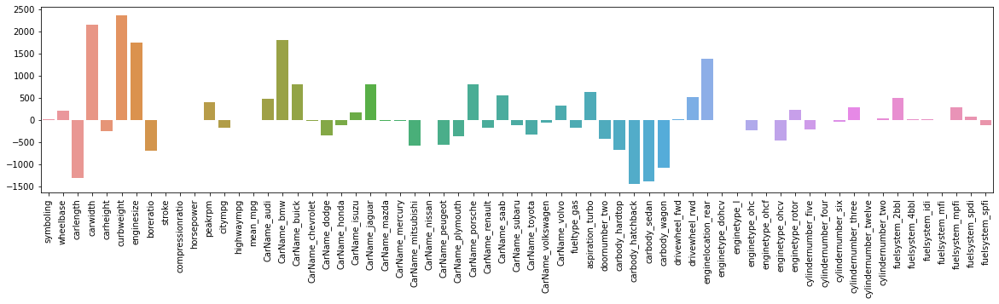

In [41]:
## Scaling of Data
scaler = StandardScaler()
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)




model = Lasso(alpha=10)
model.fit(x_train_scaled,y_train) ## Traing the Model
 
y_train_pred = model.predict(x_train_scaled) ## Getting Predicted Values from train
y_test_pred = model.predict(x_test_scaled) ## Predicted Values from test


print('Train Performance')
rmse = np.sqrt(mean_squared_error(y_train,y_train_pred))
r2 = r2_score(y_train,y_train_pred)
print(f'RMSE :{rmse}, R2: {r2}')

print('Test Performance')
rmse = np.sqrt(mean_squared_error(y_test,y_test_pred))
r2 = r2_score(y_test,y_test_pred)
print(f'RMSE :{rmse}, R2: {r2}')

plt.figure(figsize=(20,4))
sns.barplot(x_train.columns,model.coef_)
plt.xticks(rotation=90)
plt.show()

In [42]:
temp = pd.DataFrame(list(zip(x_train.columns,model.coef_)),columns=['name','coef'])

In [43]:
x_train.drop(list(temp[temp['coef']==0]['name']),axis=1,inplace=True)
x_test.drop(list(temp[temp['coef']==0]['name']),axis=1,inplace=True)

C:\Users\USER\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
C:\Users\USER\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


C:\Users\USER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Train Performance
RMSE :1226.7267689291166, R2: 0.969619834622468
Test Performance
RMSE :1686.3493135205074, R2: 0.9518495274886523


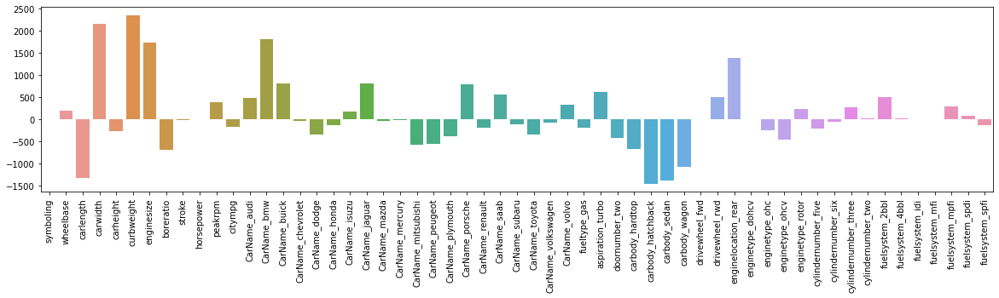

In [44]:
## Scaling of Data
scaler = StandardScaler()
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)




model = Lasso(alpha=10)
model.fit(x_train_scaled,y_train) ## Traing the Model
 
y_train_pred = model.predict(x_train_scaled) ## Getting Predicted Values from train
y_test_pred = model.predict(x_test_scaled) ## Predicted Values from test


print('Train Performance')
rmse = np.sqrt(mean_squared_error(y_train,y_train_pred))
r2 = r2_score(y_train,y_train_pred)
print(f'RMSE :{rmse}, R2: {r2}')

print('Test Performance')
rmse = np.sqrt(mean_squared_error(y_test,y_test_pred))
r2 = r2_score(y_test,y_test_pred)
print(f'RMSE :{rmse}, R2: {r2}')

plt.figure(figsize=(20,4))
sns.barplot(x_train.columns,model.coef_)
plt.xticks(rotation=90)
plt.show()

In [45]:
np.linspace(1,10,20)

array([ 1.        ,  1.47368421,  1.94736842,  2.42105263,  2.89473684,
        3.36842105,  3.84210526,  4.31578947,  4.78947368,  5.26315789,
        5.73684211,  6.21052632,  6.68421053,  7.15789474,  7.63157895,
        8.10526316,  8.57894737,  9.05263158,  9.52631579, 10.        ])